In [8]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import linear_model
from sklearn.cluster import KMeans
%matplotlib inline
from pandas import DataFrame
import folium
import pandas as pd
import numpy as np
import folium
from pathlib import Path
import json
import warnings
warnings.filterwarnings('ignore')
from folium.plugins import MarkerCluster,FastMarkerCluster
from folium import plugins
import matplotlib.cm as cmx
import matplotlib.colors as mcolors
from sklearn.cluster import MeanShift, estimate_bandwidth

### Convert latitude longitude altitude data to earth-centered-earth-fixed (ECEF) format for meshlab analyis

In [9]:
a = 6378.137
b = 6356.752

In [5]:
def lla2ECEF(lat, lon, alt):
    sin = lambda x: np.sin(x)
    cos = lambda x: np.cos(x)
    sqrt = lambda x: np.sqrt(x)
    lat *= np.pi/180
    lon *=  np.pi/180
    f = (a - b)/a
    e = sqrt(f*(2-f))
    N = a*1000 / sqrt(1 - e**2 * (sin(lat))**2)
    x = (alt + N) * cos(lon) * cos(lat)
    y = (alt + N) * cos(lon) * sin(lat)
    z = (alt + (1-e**2)*N) * sin(lon)
    rval = []
    rval.append(x)
    rval.append(y)
    rval.append(z)
    return rval

In [10]:
f = open('final_project_point_cloud.fuse', 'r')
df=pd.read_csv(f,delimiter=" ",header=None)
f.close()
df.columns=['latitude','longitude','altitude','intensity']
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 430736 entries, 0 to 430735
Data columns (total 4 columns):
latitude     430736 non-null float64
longitude    430736 non-null float64
altitude     430736 non-null float64
intensity    430736 non-null int64
dtypes: float64(3), int64(1)
memory usage: 13.1 MB


In [11]:
df.head()

,latitude,longitude,altitude,intensity
0,45.903883,11.028414,232.4648,10
1,45.903683,11.028221,234.4706,5
2,45.903683,11.028222,234.4459,7
3,45.903682,11.028224,234.4307,7
4,45.903681,11.028226,234.4232,7


### Histogram of all altitude data in 15 bins

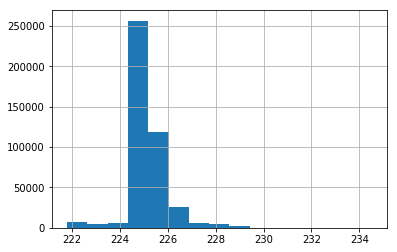

In [12]:
hist = df.altitude.hist(bins=15)
hist

In [13]:
top_5_quantile = df.altitude.quantile(.95)
top_5_quantile

226.5051

In [14]:
topalts = df[df['altitude']>=top_5_quantile]
topalts.head()

,latitude,longitude,altitude,intensity
0,45.903883,11.028414,232.4648,10
1,45.903683,11.028221,234.4706,5
2,45.903683,11.028222,234.4459,7
3,45.903682,11.028224,234.4307,7
4,45.903681,11.028226,234.4232,7


### Histogram of top 5 quantile altitude data - this is probably both pole and road guard data

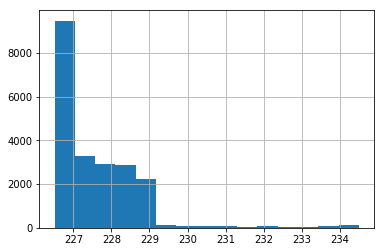

In [15]:
topalts.altitude.hist(bins=15)

### Below is a map of all the points in the top 5% quantile

In [16]:
x = topalts.latitude
y = topalts.longitude

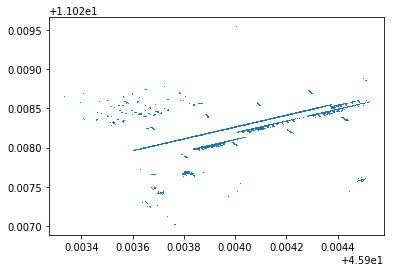

In [17]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(x, y, ',')
plt.show()

### Below is a map of all the points

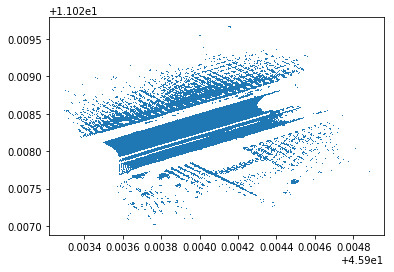

In [18]:
fullx=df.latitude
fully=df.longitude
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(fullx, fully, ',')
plt.show()

### Applying K Means

In [19]:
def applykmeans(df,k):
    kmeans = KMeans(n_clusters=k,random_state=42).fit(df[['latitude','longitude','altitude']])
    df['cluster']= kmeans.predict(df[['latitude','longitude','altitude']])

    fig,ax = plt.subplots(figsize=(20,10))
    _=ax.scatter(df.longitude,df.latitude,c=df.cluster,cmap='tab10',s=3,alpha=1)

    _=ax.set_ylabel('latitude')
    _=ax.set_xlabel('longitude')

In [20]:
#meanshift function, takes dataframe, quantile, number of samples 
def meanshift(df,quantile,nsamples):
    bw = estimate_bandwidth(df[['latitude','longitude']],quantile=quantile,n_samples=nsamples,random_state=123,n_jobs=-1)
    ms = MeanShift(bandwidth=bw, bin_seeding=True)
    cluster = ms.fit_predict(df[['latitude','longitude']])
    df['mcluster'] = cluster
    
    fig,ax = plt.subplots(figsize=(20,10))
    _=ax.scatter(df.longitude,df.latitude,c=df.mcluster,cmap='tab10',s=20,alpha=1)

    _=ax.set_ylabel('latitude')
    _=ax.set_xlabel('longitude')

In [21]:
def map_cluster(df,clusternum):
    temp = df[df.cluster==clusternum].reset_index(drop=True)

    templat = [i for i in temp.latitude]
    templon = [i for i in temp.longitude]
    locationlist = [[i[0],i[1]] for i in zip(templat,templon)]

    lat1=locationlist[0][0]
    long1=locationlist[0][1]
    m = folium.Map([lat1, long1], zoom_start=11)
    m.add_children(plugins.HeatMap(locationlist, radius=15))
    return m

In [22]:
def map_mcluster(df,clusternum):
    temp = df[df.mcluster==clusternum].reset_index(drop=True)

    templat = [i for i in temp.latitude]
    templon = [i for i in temp.longitude]
    locationlist = [[i[0],i[1]] for i in zip(templat,templon)]

    lat1=locationlist[0][0]
    long1=locationlist[0][1]
    m = folium.Map([lat1, long1], zoom_start=11)
    m.add_children(plugins.HeatMap(locationlist, radius=15))
    return m

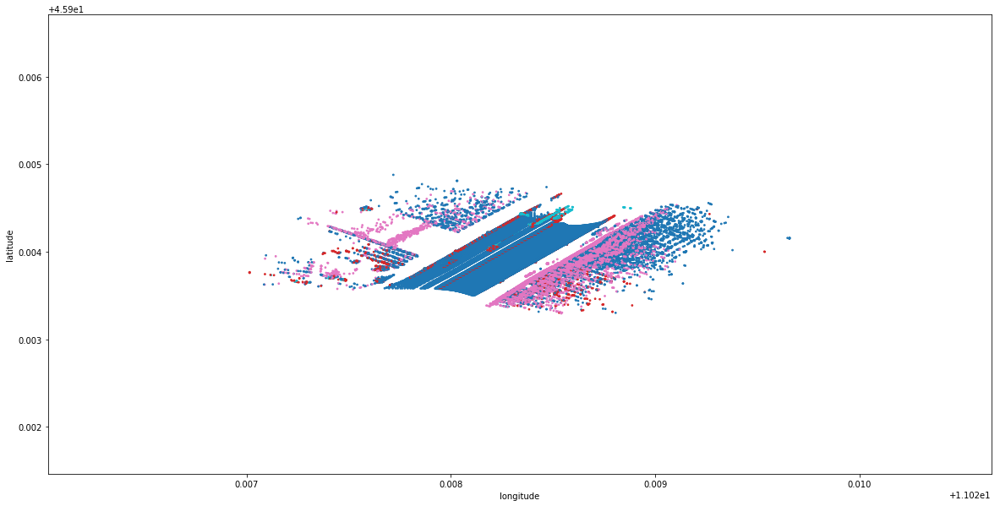

In [23]:
k = 4
applykmeans(df,k)

### Using Folium to map data points on a basemap layer

In [26]:
map_cluster(df,0)

In [27]:
map_cluster(df,1)

In [28]:
map_cluster(df,2)

In [29]:
map_cluster(df,3)

### Split up data by cluster for analysis

In [31]:
c0 = df[df["cluster"]==0]
c1 = df[df["cluster"]==1]
c2 = df[df["cluster"]==2]
c3 = df[df["cluster"]==3]

### Histogram of altitude data for each cluster

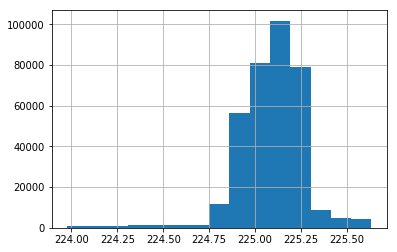

In [32]:
c0.altitude.hist(bins=15)

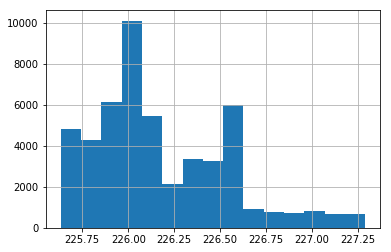

In [33]:
c1.altitude.hist(bins=15)

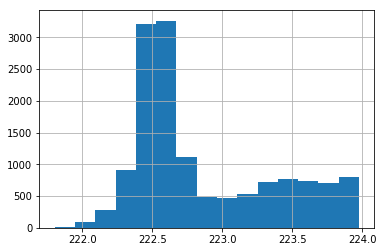

In [34]:
c2.altitude.hist(bins=15)

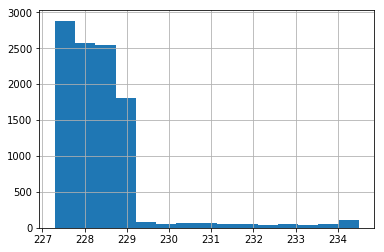

In [35]:
c3.altitude.hist(bins=15)

### Cluster size: note that cluster 1 has most of the road data and most of the points

In [36]:
print(c0.shape)
print(c1.shape)
print(c2.shape)
print(c3.shape)

(355913, 5)
(50241, 5)
(14106, 5)
(10476, 5)


### Road boundary points plot

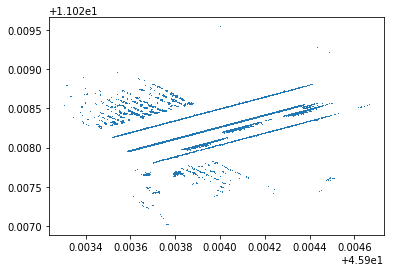

In [37]:
fullx=c1.latitude
fully=c1.longitude
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(fullx, fully, ',')
plt.show()

#### C1 contains road boundary Data, so save that the XYZ format file for meshlab analysis

In [ ]:
ntemp0 = temp0.copy()

maxit = c1.shape[0]
temp0=pd.DataFrame(columns=['x','y','z'])
for i in range(maxit):
    if i%1000==0: print(i)
    temp0.loc[len(temp0)] = lla2ECEF(c1.iloc[i][0],c1.iloc[i][1],c1.iloc[i][2])

In [ ]:
ntemp0.to_csv("dfsave.xyz",header=False,index=False,sep=' ')